<a href="https://colab.research.google.com/github/prasanna2019/Geospatial-Analysis/blob/main/Geopandas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [109]:
!pip install geopandas geodatasets shapely mapclassify sklearn

  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [110]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
import geodatasets
import mapclassify
from sklearn.cluster import DBSCAN
import numpy

In [111]:
shooting_df= pd.read_csv("https://raw.githubusercontent.com/prasanna2019/Restaurant-Analysis/refs/heads/main/nyc_shooting.csv")

In [112]:
shooting_df.head()

,incident_key,occur_date,occur_time,boro,precinct,jurisdiction_code,location_desc,perp_age_group,perp_sex,perp_race,...,vic_sex,vic_race,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,statistical_murder_flag,loc_classfctn_desc,loc_of_occur_desc
0,283885164,2024-03-16T00:00:00.000,12:45:00,MANHATTAN,9,0,(null),25-44,M,WHITE HISPANIC,...,M,BLACK,989057,204238,40.727261,-73.982657,POINT (-73.98265669309377 40.72726147876676),N,STREET,OUTSIDE
1,280943246,2024-01-22T00:00:00.000,22:21:00,BRONX,44,0,(null),25-44,M,BLACK HISPANIC,...,M,WHITE HISPANIC,1006796,241740,40.830170,-73.918527,POINT (-73.918527 40.83017),N,STREET,OUTSIDE
2,282368516,2024-02-17T00:00:00.000,02:36:00,QUEENS,102,0,GAS STATION,18-24,M,WHITE HISPANIC,...,M,BLACK,1036134,192055,40.693673,-73.812899,POINT (-73.812899 40.693673),N,STREET,OUTSIDE
3,287476966,2024-05-24T00:00:00.000,23:50:00,BROOKLYN,90,2,MULTI DWELL - PUBLIC HOUS,(null),(null),(null),...,M,BLACK,1000956,195764,40.703990,-73.939746,POINT (-73.939746 40.70399),N,HOUSING,OUTSIDE
4,282117921,2024-02-12T00:00:00.000,16:32:00,BRONX,44,1,(null),<18,M,BLACK HISPANIC,...,F,WHITE HISPANIC,1007839,246906,40.844344,-73.914743,POINT (-73.91474279614735 40.844343526095244),N,TRANSIT,INSIDE


In [113]:
shooting_df.dropna(inplace= True)

In [114]:
nybb= gpd.read_file(geodatasets.get_path('nybb'))

 **Exploring Newyork Boroughs on map**

In [115]:
nybb.explore()

* Analyzing the relationship between the month of incidents and their frequency.
* Identifying the demographics (race and age) of the most affected victims and their perpetrators to understand underlying patterns.
* Investigating the relationship between shooting incidents and the economic status of neighborhoods to assess potential socioeconomic factors.
* Analyzing changes in incident rates over time to identify neighborhoods with increasing crime rates.
* Exploring the relationship between crime rates and the dominant racial demographics in neighborhoods to uncover potential social or cultural correlations.


**Extracting Geometry Data from a Geocoded Column**

In [116]:
shooting_df['geometry'] = shooting_df['geocoded_column'].astype('string').apply(wkt.loads)


In [117]:
shooting_df['geometry']

,geometry
0,POINT (-73.98265669309377 40.72726147876676)
1,POINT (-73.918527 40.83017)
2,POINT (-73.812899 40.693673)
3,POINT (-73.939746 40.70399)
4,POINT (-73.91474279614735 40.844343526095244)
...,...
565,POINT (-73.944875 40.813698)
566,POINT (-73.900215 40.861094)
567,POINT (-73.87130201239103 40.67285815573826)
568,POINT (-73.937712 40.841384)


In [118]:
shooting_df.drop(columns= 'geocoded_column', inplace= True)    # Drop the geocoded_column

**Converting datadrame to Geopandas dataframe**

In [119]:
shooting_gdf= gpd.GeoDataFrame(shooting_df, geometry= shooting_df.geometry, crs= 'EPSG: 4236')


In [120]:
shooting_gdf.crs

<Geographic 2D CRS: EPSG: 4236>
Name: Hu Tzu Shan 1950
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Taiwan, Republic of China - onshore - Taiwan Island, Penghu (Pescadores) Islands.
- bounds: (119.25, 21.87, 122.06, 25.34)
Datum: Hu Tzu Shan 1950
- Ellipsoid: International 1924
- Prime Meridian: Greenwich

In [121]:
shooting_gdf.columns

Index(['incident_key', 'occur_date', 'occur_time', 'boro', 'precinct',
       'jurisdiction_code', 'location_desc', 'perp_age_group', 'perp_sex',
       'perp_race', 'vic_age_group', 'vic_sex', 'vic_race', 'x_coord_cd',
       'y_coord_cd', 'latitude', 'longitude', 'statistical_murder_flag',
       'loc_classfctn_desc', 'loc_of_occur_desc', 'geometry'],
      dtype='object')

**Converting the occur_date Column from String to Datetime Format**

In [122]:
shooting_gdf['occur_date']= pd.to_datetime(shooting_gdf['occur_date'])

In [123]:
shooting_gdf_copy= shooting_gdf.copy()

**Month column from occur_date**

In [124]:
shooting_gdf_copy['occur_month']= shooting_gdf_copy['occur_date'].dt.month

In [125]:
shooting_by_month= shooting_gdf_copy.groupby('occur_month').size().reset_index(name='incident_count')

**Identifying the Correlation Between Month of the year and number of incidents occured**

In [126]:
shooting_by_month['occur_month'].corr(shooting_by_month['incident_count'])

0.8026156581872705

In [127]:
shooting_by_month.head(12)

,occur_month,incident_count
0,1,79
1,2,88
2,3,71
3,4,84
4,5,108
5,6,124


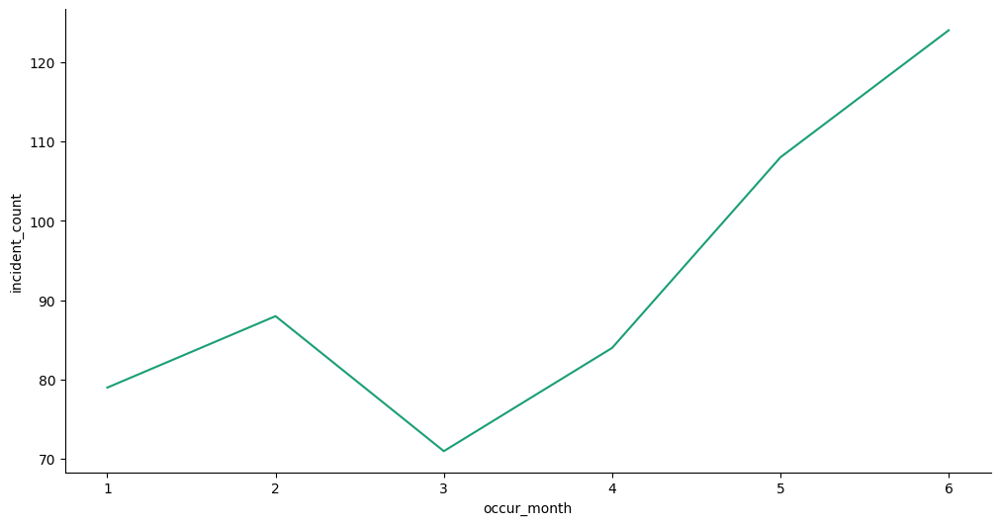

In [128]:
# @title occur_month vs incident_count

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['occur_month']
  ys = series['incident_count']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = shooting_by_month.sort_values('occur_month', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('occur_month')
_ = plt.ylabel('incident_count')

**Distribution of shooting incidents across different victim races.**

In [129]:
shooting_gdf['vic_race'].value_counts()

,count
vic_race,
BLACK,360
WHITE HISPANIC,108
BLACK HISPANIC,66
ASIAN / PACIFIC ISLANDER,13
WHITE,4
AMERICAN INDIAN/ALASKAN NATIVE,2
UNKNOWN,1


In [130]:
shooting_gdf.groupby(['perp_race', 'perp_age_group']).size().reset_index(name='cases').sort_values(by='cases', ascending=False)

,perp_race,perp_age_group,cases
0,(null),(null),271
5,BLACK,25-44,71
14,WHITE HISPANIC,25-44,35
3,BLACK,18-24,30
7,BLACK,<18,29
13,WHITE HISPANIC,18-24,25
9,BLACK HISPANIC,25-44,24
6,BLACK,45-64,17
8,BLACK HISPANIC,18-24,15
11,BLACK HISPANIC,<18,15


In [131]:
nybb= nybb.to_crs('4236')

In [132]:
shooting_gdf.explore()

In [133]:
shooting_ny= shooting_gdf.clip(nybb)

In [134]:
nybb['geometry'].dropna(inplace= True)

In [135]:
nybb.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."


In [136]:
m= nybb.explore(color= 'blue')
shooting_gdf.explore(m=m, color= 'red')

**Join shooting_gdf and nybb to get shooting within New York**

In [137]:
shooting_join= gpd.sjoin(shooting_gdf, nybb, how= 'inner', predicate='within')

In [138]:
shooting_join.head()

,incident_key,occur_date,occur_time,boro,precinct,jurisdiction_code,location_desc,perp_age_group,perp_sex,perp_race,...,longitude,statistical_murder_flag,loc_classfctn_desc,loc_of_occur_desc,geometry,index_right,BoroCode,BoroName,Shape_Leng,Shape_Area
0,283885164,2024-03-16,12:45:00,MANHATTAN,9,0,(null),25-44,M,WHITE HISPANIC,...,-73.982657,N,STREET,OUTSIDE,POINT (-73.98266 40.72726),3,1,Manhattan,359299.096471,6.364715e+08
1,280943246,2024-01-22,22:21:00,BRONX,44,0,(null),25-44,M,BLACK HISPANIC,...,-73.918527,N,STREET,OUTSIDE,POINT (-73.91853 40.83017),4,2,Bronx,464392.991824,1.186925e+09
2,282368516,2024-02-17,02:36:00,QUEENS,102,0,GAS STATION,18-24,M,WHITE HISPANIC,...,-73.812899,N,STREET,OUTSIDE,POINT (-73.8129 40.69367),1,4,Queens,896344.047763,3.045213e+09
3,287476966,2024-05-24,23:50:00,BROOKLYN,90,2,MULTI DWELL - PUBLIC HOUS,(null),(null),(null),...,-73.939746,N,HOUSING,OUTSIDE,POINT (-73.93975 40.70399),2,3,Brooklyn,741080.523166,1.937479e+09
4,282117921,2024-02-12,16:32:00,BRONX,44,1,(null),<18,M,BLACK HISPANIC,...,-73.914743,N,TRANSIT,INSIDE,POINT (-73.91474 40.84434),4,2,Bronx,464392.991824,1.186925e+09


In [139]:
shooting_join.columns

Index(['incident_key', 'occur_date', 'occur_time', 'boro', 'precinct',
       'jurisdiction_code', 'location_desc', 'perp_age_group', 'perp_sex',
       'perp_race', 'vic_age_group', 'vic_sex', 'vic_race', 'x_coord_cd',
       'y_coord_cd', 'latitude', 'longitude', 'statistical_murder_flag',
       'loc_classfctn_desc', 'loc_of_occur_desc', 'geometry', 'index_right',
       'BoroCode', 'BoroName', 'Shape_Leng', 'Shape_Area'],
      dtype='object')

**Drop unwanted columns**

In [140]:
shooting_join.drop(columns= [ 'location_desc', 'index_right'], inplace= True)

**Shooting incidents per borough**

In [141]:
shooting_join.groupby('boro').size().reset_index(name='incidents')

,boro,incidents
0,BRONX,217
1,BROOKLYN,165
2,MANHATTAN,93
3,QUEENS,72
4,STATEN ISLAND,7


**Boro level incident data**

In [142]:
result = shooting_join.groupby('boro').agg(
    total_incidents=('incident_key', 'count'),
    freq_perp_race=('perp_race', lambda x: x.value_counts().idxmax()), # Frequent perpetrator race
    fpr_incidents=('perp_race', lambda x: x.value_counts().max())      # Number of incidents by the frequent perpetrator race
).reset_index()

In [143]:
result

,boro,total_incidents,freq_perp_race,fpr_incidents
0,BRONX,217,(null),93
1,BROOKLYN,165,(null),102
2,MANHATTAN,93,BLACK,34
3,QUEENS,72,(null),44
4,STATEN ISLAND,7,BLACK,6


In [144]:
shooting_join['latitude'].isna().sum()

0

**Perform DBSCAN to get clusters of shooting data. We set the distance of 2 km for eps and 5 as minimum points in a cluster.**

In [145]:
coordinates= numpy.array(shooting_join[['longitude', 'latitude']])

In [146]:
coordinates

array([[-73.98265669,  40.72726148],
       [-73.918527  ,  40.83017   ],
       [-73.812899  ,  40.693673  ],
       ...,
       [-73.87130201,  40.67285816],
       [-73.937712  ,  40.841384  ],
       [-73.904672  ,  40.859017  ]])

In [147]:
db= DBSCAN(eps=0.02, min_samples=5).fit(coordinates)

In [148]:
shooting_gdf['cluster'] = db.labels_

In [149]:
shooting_gdf.explore(column= 'cluster')